<a href="https://colab.research.google.com/github/shehara123/asteroid/blob/main/4thstlast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib
from sklearn.model_selection import train_test_split

In [ ]:
! mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download sameepvani/nasa-nearest-earth-objects

  0% 0.00/6.60M [00:00<?, ?B/s]
100% 6.60M/6.60M [00:00<00:00, 94.2MB/s]


In [ ]:
! unzip nasa-nearest-earth-objects

Archive:  nasa-nearest-earth-objects.zip
  inflating: neo.csv                 
  inflating: neo_v2.csv              


In [ ]:
df = pd.read_csv("neo.csv")
df.head()

,id,name,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,orbiting_body,sentry_object,absolute_magnitude,hazardous
0,2162635,162635 (2000 SS164),1.198271,2.679415,13569.249224,5.483974e+07,Earth,False,16.73,False
1,2277475,277475 (2005 WK4),0.265800,0.594347,73588.726663,6.143813e+07,Earth,False,20.00,True
2,2512244,512244 (2015 YE18),0.722030,1.614507,114258.692129,4.979872e+07,Earth,False,17.83,False
3,3596030,(2012 BV13),0.096506,0.215794,24764.303138,2.543497e+07,Earth,False,22.20,False
4,3667127,(2014 GE35),0.255009,0.570217,42737.733765,4.627557e+07,Earth,False,20.09,True


id and name are not useful therefore, those columns are dropped

In [ ]:
dt = df.drop(['id','name'],axis=1)

In [ ]:
dt.describe()

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude
count,90836.000000,90836.000000,90836.000000,9.083600e+04,90836.000000
mean,0.127432,0.284947,48066.918918,3.706655e+07,23.527103
std,0.298511,0.667491,25293.296961,2.235204e+07,2.894086
min,0.000609,0.001362,203.346433,6.745533e+03,9.230000
25%,0.019256,0.043057,28619.020645,1.721082e+07,21.340000
50%,0.048368,0.108153,44190.117890,3.784658e+07,23.700000
75%,0.143402,0.320656,62923.604633,5.654900e+07,25.700000
max,37.892650,84.730541,236990.128088,7.479865e+07,33.200000


In [ ]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90836 entries, 0 to 90835
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   est_diameter_min    90836 non-null  float64
 1   est_diameter_max    90836 non-null  float64
 2   relative_velocity   90836 non-null  float64
 3   miss_distance       90836 non-null  float64
 4   orbiting_body       90836 non-null  object 
 5   sentry_object       90836 non-null  bool   
 6   absolute_magnitude  90836 non-null  float64
 7   hazardous           90836 non-null  bool   
dtypes: bool(2), float64(5), object(1)
memory usage: 4.3+ MB


In [ ]:
dt.isna().sum()

est_diameter_min      0
est_diameter_max      0
relative_velocity     0
miss_distance         0
orbiting_body         0
sentry_object         0
absolute_magnitude    0
hazardous             0
dtype: int64

no missing values were observed

In [ ]:
print(dt.describe(include=['object']))

       orbiting_body
count          90836
unique             1
top            Earth
freq           90836


In [ ]:
set(dt['sentry_object'])

{False}

only one category is included in orbiting_body column, and sentry_object therefore, those columns are dropped.

In [ ]:
dt = dt.drop(['orbiting_body','sentry_object'],axis=1)

In [ ]:
dt.shape

(90836, 6)

In [ ]:
dt.head()

,est_diameter_min,est_diameter_max,relative_velocity,miss_distance,absolute_magnitude,hazardous
0,1.198271,2.679415,13569.249224,5.483974e+07,16.73,False
1,0.265800,0.594347,73588.726663,6.143813e+07,20.00,True
2,0.722030,1.614507,114258.692129,4.979872e+07,17.83,False
3,0.096506,0.215794,24764.303138,2.543497e+07,22.20,False
4,0.255009,0.570217,42737.733765,4.627557e+07,20.09,True


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


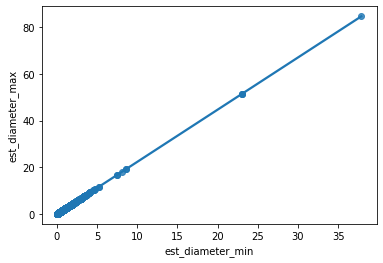

In [ ]:
sns.regplot(dt['est_diameter_min'], dt['est_diameter_max'], ci=None)

In [ ]:
np.corrcoef(dt['est_diameter_max'],dt['est_diameter_min'])[0,1]

1.0

est_diameter_max and est_diameter_min is perfectly are perfectly correlated.

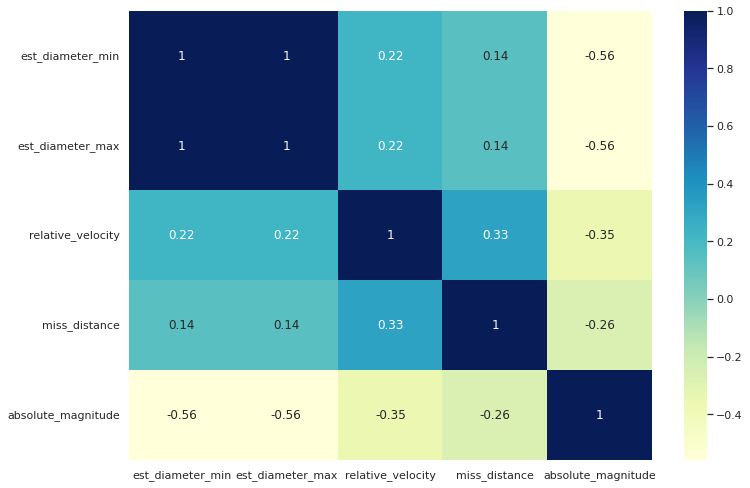

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.heatmap(dt.drop(['hazardous'],axis=1).corr(),cmap="YlGnBu",annot=True)

splitting data set into train and test

In [ ]:
training_data = dt.sample(frac=0.8, random_state=25)
testing_data = dt.drop(training_data.index)

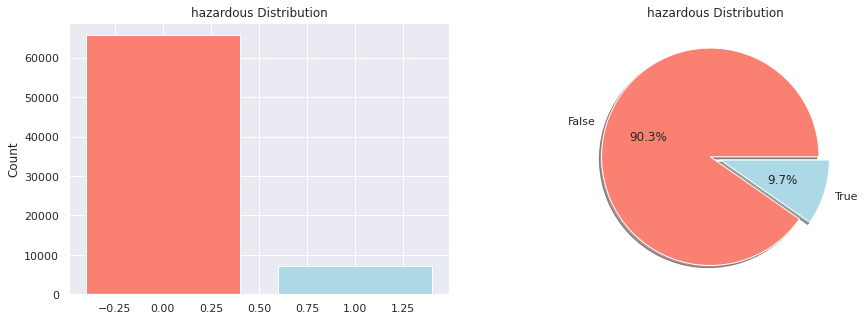

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=1,ncols=2, figsize=(15,5))

# Plot 1
ax1.bar(training_data["hazardous"].value_counts().index, training_data["hazardous"].value_counts(),color=["salmon", "lightblue"])
ax1.set(title="hazardous Distribution",ylabel="Count")

# Plot 2
ax2.pie(training_data["hazardous"].value_counts(),colors=["salmon", "lightblue"],
        labels= ["False", "True"] , 
        autopct='%1.1f%%',explode=[0.05,0.05] ,startangle=0, shadow = True)
ax2.set(title="hazardous Distribution");

{'whiskers': [<matplotlib.lines.Line2D at 0x7f41dbc6e7d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7f41db18d8d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f41db18b850>],
 'medians': [<matplotlib.lines.Line2D at 0x7f41db1943d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f41db194910>],
 'means': []}

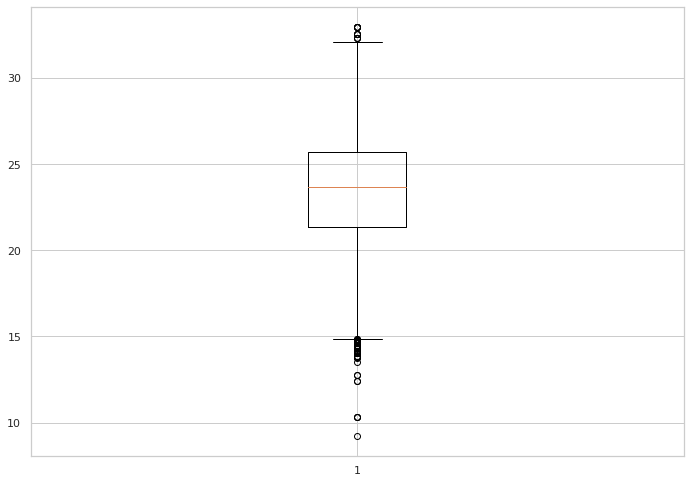

In [ ]:
sns.set_style("whitegrid")
matplotlib.rcParams['figure.facecolor'] = '#00000000'
plt.boxplot(training_data['absolute_magnitude'])

{'whiskers': [<matplotlib.lines.Line2D at 0x7f41db132250>,
 'caps': [<matplotlib.lines.Line2D at 0x7f41db16fa50>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f41db16f6d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7f41db0fc290>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f41db16fa10>],
 'means': []}

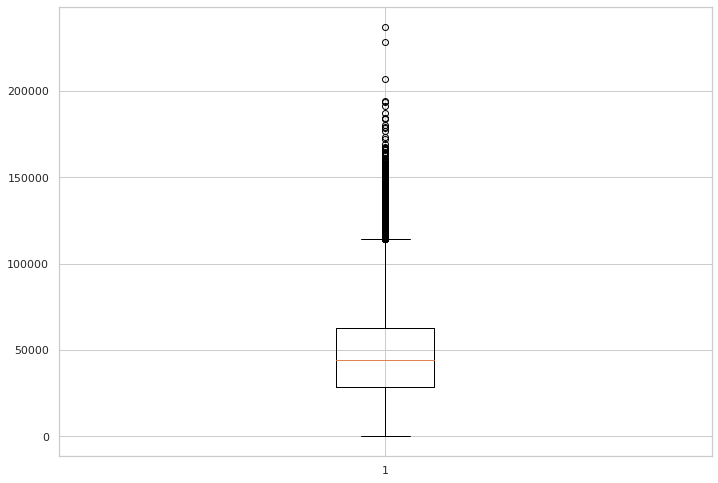

In [ ]:
plt.boxplot(training_data['relative_velocity'])

{'whiskers': [<matplotlib.lines.Line2D at 0x7f41db127e90>,
 'caps': [<matplotlib.lines.Line2D at 0x7f41db0db9d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f41db0d6950>],
 'medians': [<matplotlib.lines.Line2D at 0x7f41db0e14d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f41db0e1a10>],
 'means': []}

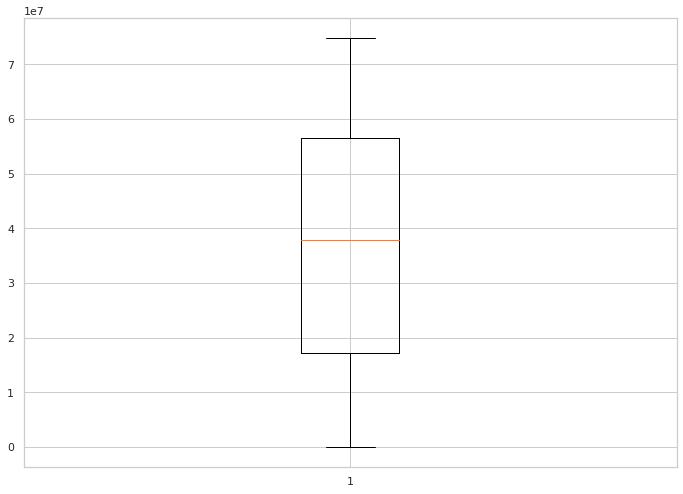

In [ ]:
plt.boxplot(training_data['miss_distance'])

{'whiskers': [<matplotlib.lines.Line2D at 0x7f41db096090>,
 'caps': [<matplotlib.lines.Line2D at 0x7f41db04de90>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f41db044e10>],
 'medians': [<matplotlib.lines.Line2D at 0x7f41db053990>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f41db053ed0>],
 'means': []}

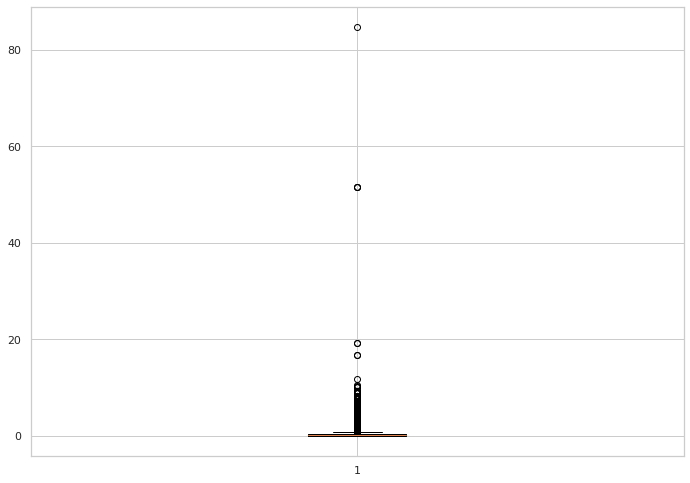

In [ ]:
plt.boxplot(training_data['est_diameter_max'])

In [ ]:
px.histogram(training_data, 
             x='est_diameter_max', 
             title='est_diameter_max vs  hazardous',
             marginal='box',
             color='hazardous')

In [ ]:
px.histogram(training_data, 
             x='est_diameter_max', 
             title='est_diameter_max vs  hazardous',
             marginal='box',
             color='hazardous',
             range_x=[0,2])


In [ ]:
px.histogram(training_data, 
             x='relative_velocity', 
             title='relative_velocity vs  hazardous',
             marginal='box',
             color='hazardous')

In [ ]:
px.histogram(training_data, 
             x='miss_distance', 
             title='miss_distance vs  hazardous',
             marginal='box',
             color='hazardous')

In [ ]:
px.histogram(training_data, 
             x='absolute_magnitude', 
             title='absolute_magnitude vs  hazardous',
             marginal='box',
             color='hazardous')

Scatter plot between est_diameter_min vs absolute_magnitude

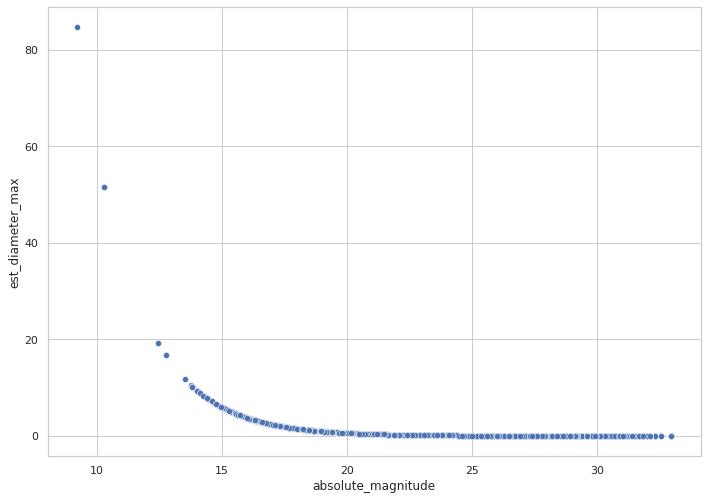

In [ ]:
sns.scatterplot(x="absolute_magnitude", y="est_diameter_max", data=training_data)


estimating equation between est_diameter_min and absolute_magnitude

In [ ]:
from numpy.ma.core import trace
from numpy import arange
from scipy.optimize import curve_fit
from matplotlib import pyplot
from sklearn.metrics import mean_squared_error

# define the true objective function
def objective(x, a,b,c):
	return  a/ (x**b) +c

x , y = training_data['absolute_magnitude'],training_data['est_diameter_max']

popt, _ = curve_fit(objective, x, y)

a, b, c = popt
print(a,b,c)

63987799.135930546 6.035718866538284 -0.2033096901714229


In [ ]:
pred =[]
for x in training_data['absolute_magnitude']:
  a = (63987799.135930546/x**6.035718866538284)-0.2033096901714229
  pred.append(a)

mean_squared_error(training_data['est_diameter_max'],pred)

0.01118803578110716

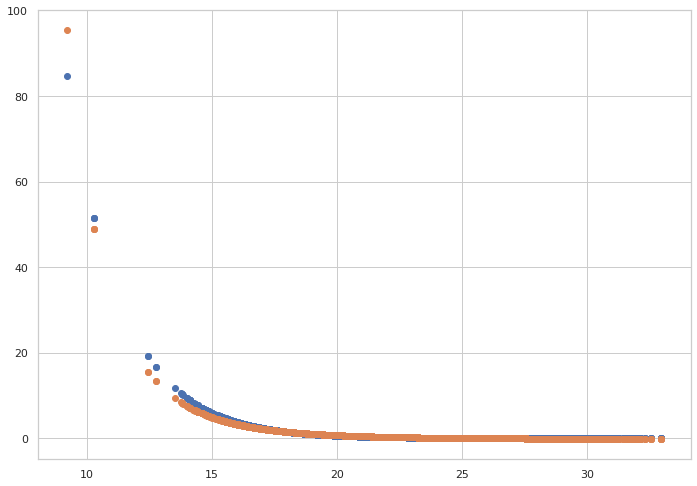

In [ ]:
plt.scatter(training_data['absolute_magnitude'],training_data['est_diameter_max'])
plt.scatter(training_data['absolute_magnitude'],pred)

after observing decision boundries it was decided that take only records which have absolute magnitude less than 22.5

In [ ]:
nw_train = training_data.loc[training_data['absolute_magnitude'] <=22.5 ]
nw_test = testing_data.loc[testing_data['absolute_magnitude'] <= 22.5]
print(nw_train.shape,nw_test.shape)

(27078, 6) (6772, 6)


In [ ]:
px.histogram(nw_train, 
             x='absolute_magnitude', 
             title='absolute_magnitude vs  hazardous',
             marginal='box',
             color='hazardous')

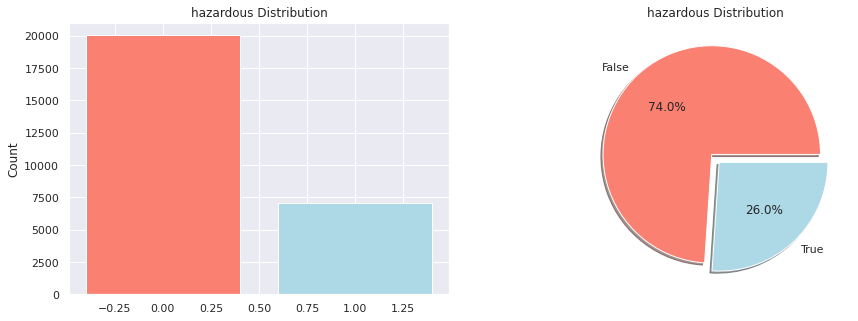

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=1,ncols=2, figsize=(15,5))

# Plot 1
ax1.bar(nw_train["hazardous"].value_counts().index, nw_train["hazardous"].value_counts(),color=["salmon", "lightblue"])
ax1.set(title="hazardous Distribution",ylabel="Count")

# Plot 2
ax2.pie(nw_train["hazardous"].value_counts(),colors=["salmon", "lightblue"],
        labels= ["False", "True"] , 
        autopct='%1.1f%%',explode=[0.05,0.05] ,startangle=0, shadow = True)
ax2.set(title="hazardous Distribution");

still large imbalnce precsence in the training set.

(0.0, 4.0)

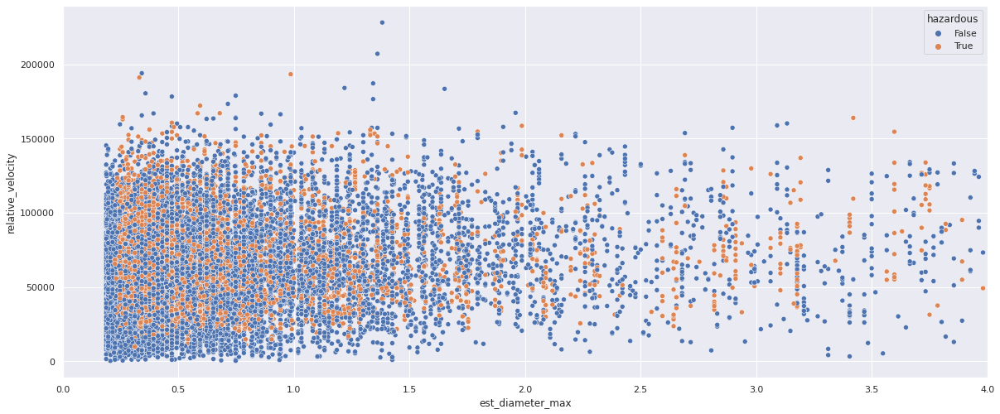

In [ ]:
sns.set(rc={'figure.figsize':(20,8.27)})
sns.scatterplot(x="est_diameter_max", y="relative_velocity", hue='hazardous', data=nw_train)
plt.xlim(0, 4)

(0.0, 5.0)

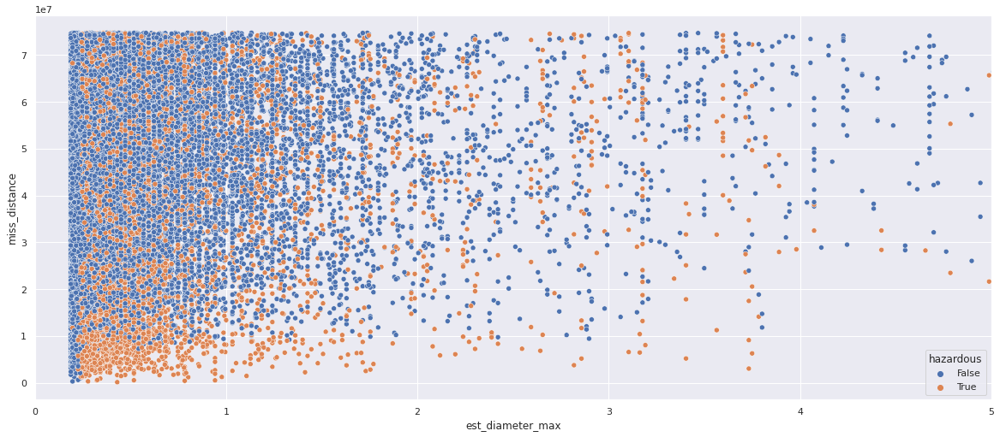

In [ ]:
sns.scatterplot(x="est_diameter_max", y="miss_distance", hue='hazardous', data=nw_train)
plt.xlim(0, 5)

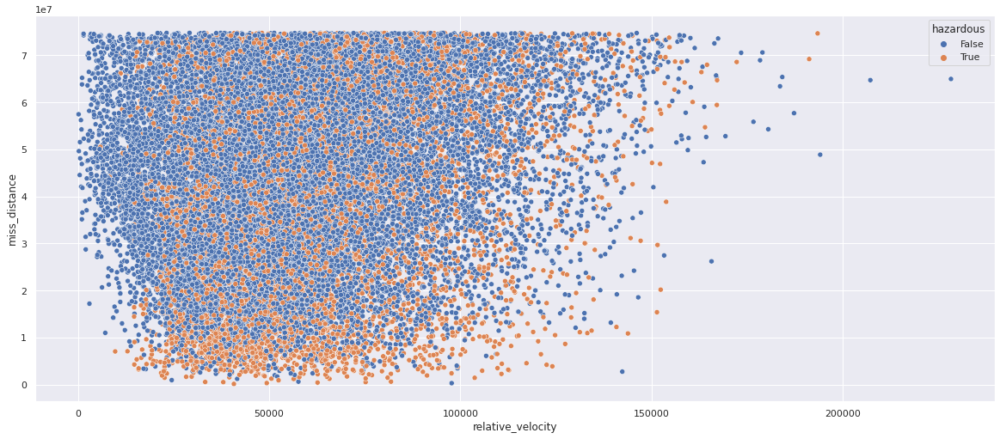

In [ ]:
sns.scatterplot(x="relative_velocity", y="miss_distance", hue='hazardous', data=nw_train)


(12.0, 23.0)

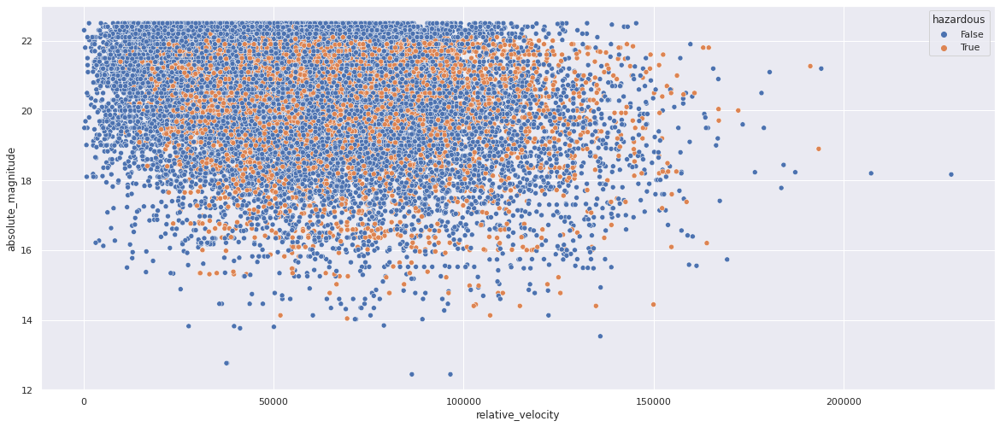

In [ ]:
sns.scatterplot(x="relative_velocity", y="absolute_magnitude", hue='hazardous', data=nw_train)
plt.ylim(12, 23)

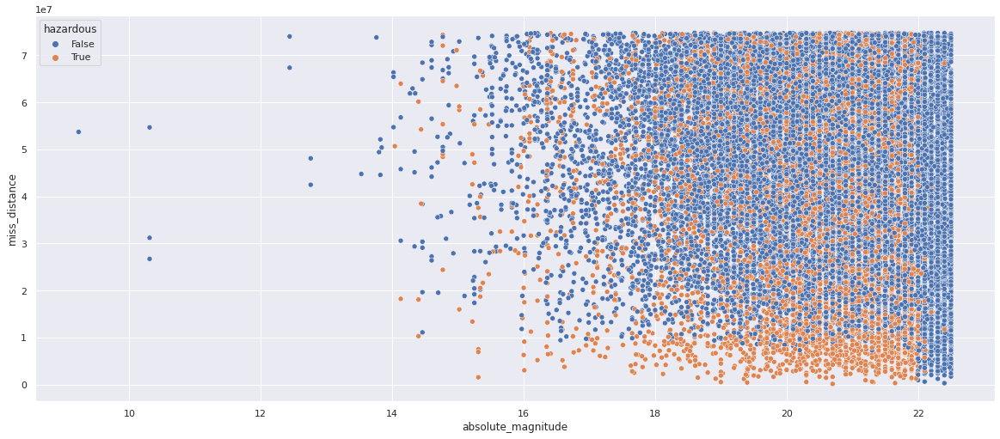

In [ ]:
sns.scatterplot(x="absolute_magnitude", y="miss_distance", hue='hazardous', data=nw_train)



In [ ]:
fig = px.scatter_3d(nw_train, x='relative_velocity', y='miss_distance', z='absolute_magnitude',
              color='hazardous')
fig.show()

model building

In [ ]:
x_train = nw_train.drop(labels="hazardous", axis =1)
y_train = nw_train['hazardous']
x_test = nw_test.drop(labels="hazardous", axis =1)
y_test = nw_test['hazardous']